## Loading and Processing CSV Data


In [19]:
import pandas as pd

df = pd.read_csv('out/hin-eng_laser.csv')
df2 = pd.read_csv('out/tur-eng_labse.csv')


 ## Parse verse_reference to Extract Book, Chapter, and Verse

In [49]:
import re
import pandas as pd

def parse_verse_reference(ref):
    if not isinstance(ref, str):
        # Handle non-string values
        return pd.Series([None, None, None])
    
    match = re.match(r'([^\d]+)\s+(\d+):(\d+)', ref)
    if match:
        book = match.group(1).strip()
        chapter = int(match.group(2))
        verse = int(match.group(3))
        return pd.Series([book, chapter, verse])
    else:
        
        return pd.Series([None, None, None])

df[['Book', 'Chapter', 'Verse']] = df['vref_mapped'].apply(parse_verse_reference)
df2[['Book', 'Chapter', 'Verse']] = df2['vref_mapped'].apply(parse_verse_reference)


missing_refs = df['vref_mapped'].isnull().sum()
missing_refs2 = df2['vref_mapped'].isnull().sum()

print(f"Number of missing verse references: {missing_refs}")
print(f"Number of missing verse references: {missing_refs2}")


Number of missing verse references: 30
Number of missing verse references: 1


In [51]:
df1

,verse_reference,revision_sentence,reference_sentence,sim_scores_1,vref_mapped
0,MAT 17:21,Başlangıçta Tanrı göğü ve yeri yarattı.,In the beginning God created the heaven and th...,0.927122,GEN 1:1
1,MAT 18:11,"Yer boştu, yeryüzü şekilleri yoktu; engin kara...","And the earth was without form, and void; and ...",0.383995,GEN 1:2
2,MAT 23:14,"Tanrı, “Işık olsun” diye buyurdu ve ışık oldu.","And God said, Let there be light: and there wa...",0.848938,GEN 1:3
3,MRK 7:16,Tanrı ışığın iyi olduğunu gördü ve onu karanlı...,"And God saw the light, that it was good: and G...",0.490332,GEN 1:4
4,MRK 9:44,"Işığa “Gündüz”, karanlığa “Gece” adını verdi. ...","And God called the light Day, and the darkness...",0.437408,GEN 1:5
...,...,...,...,...,...
41895,NaN,NaN,NaN,NaN,ENO 42:13
41896,NaN,NaN,NaN,NaN,ENO 42:14
41897,NaN,NaN,NaN,NaN,ENO 42:15
41898,NaN,NaN,NaN,NaN,ENO 42:16


Similarity Score Statistics:
count    31097.000000
mean         0.666172
std          0.201797
min          0.122666
25%          0.463741
50%          0.719791
75%          0.835290
max          0.989233
Name: sim_scores, dtype: float64


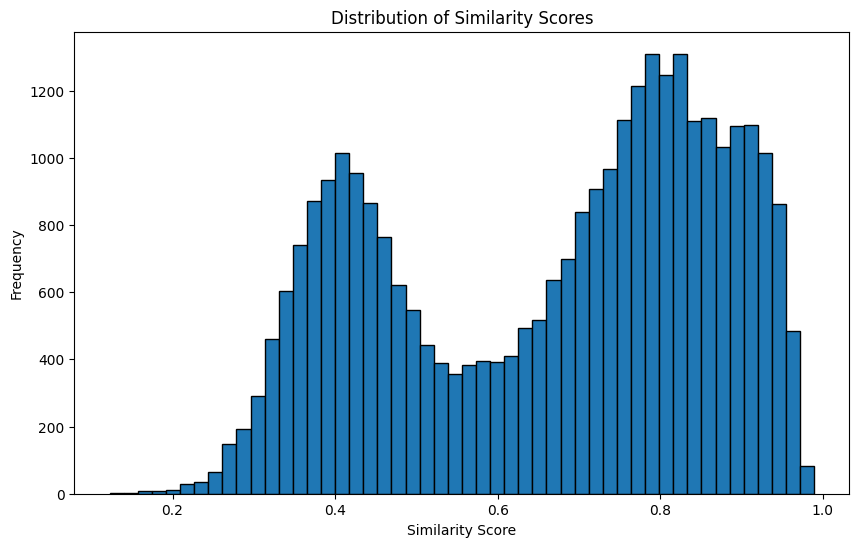


Top 10 Most Similar Verses:
      vref_mapped  sim_scores  \
12539    NEH 9:25    0.989233   
26783   JHN 15:16    0.987263   
18796    ISA 54:4    0.984465   
22036     DAN 8:7    0.984245   
21255    EZK 29:4    0.984176   
1417    GEN 46:31    0.983416   
1290    GEN 42:38    0.983105   
1110    GEN 37:27    0.983007   
1273    GEN 42:21    0.982715   
10764   1CH 12:41    0.982481   

                                       revision_sentence  \
12539  उन्होंने गढ़वाले नगर और उपजाऊ भूमि ले ली, और स...   
26783  तुम ने मुझे नहीं चुना* परन्तु मैंने तुम्हें चु...   
18796  “मत डर, क्योंकि तेरी आशा फिर नहीं टूटेगी; मत घ...   
22036  मैंने देखा कि वह मेढ़े के निकट आकर उस पर झुँझल...   
21255  मैं तेरे जबड़ों में नकेल डालूँगा, और तेरी नदिय...   
1417   तब यूसुफ ने अपने भाइयों से और अपने पिता के घरा...   
1290   उसने कहा, “मेरा पुत्र तुम्हारे संग न जाएगा; क्...   
1110   आओ, हम उसे इश्माएलियों के हाथ बेच डालें, और अप...   
1273   उन्होंने आपस में कहा, “निःसन्देह हम अपने भाई क...   
10764  

KeyError: 'Book'

In [20]:

sim_stats = df['sim_scores'].describe()
print("Similarity Score Statistics:")
print(sim_stats)

# Plot a histogram of similarity scores
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(df['sim_scores'], bins=50, edgecolor='black')
plt.title('Distribution of Similarity Scores')
plt.xlabel('Similarity Score')
plt.ylabel('Frequency')
plt.show()

# Find verses with highest and lowest similarity scores
top_similar = df.nlargest(10, 'sim_scores')[['vref_mapped', 'sim_scores','revision_sentence','reference_sentence']]
least_similar = df.nsmallest(10, 'sim_scores')[['vref_mapped', 'sim_scores','revision_sentence','reference_sentence']]

print("\nTop 10 Most Similar Verses:")
print(top_similar)

print("\nTop 10 Least Similar Verses:")
print(least_similar)

# Calculate and print average similarity score by book
avg_sim_by_book = df.groupby('Book')['sim_scores'].mean().sort_values(ascending=False)
print("\nAverage Similarity Score by Book:")
print(avg_sim_by_book.head(10))

# Visualize average similarity score by book
plt.figure(figsize=(12, 6))
avg_sim_by_book.plot(kind='bar')
plt.title('Average Similarity Score by Book')
plt.xlabel('Book')
plt.ylabel('Average Similarity Score')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel

# Load the two CSV files
df1 = pd.read_csv('out/tur-eng_laser.csv')
df2 = pd.read_csv('out/tur-eng_labse.csv')

# Rename sim_scores columns
df1 = df1.rename(columns={'sim_scores': 'sim_scores_1'})
df2 = df2.rename(columns={'sim_scores': 'sim_scores_2'})

# Check for duplicates in 'verse_reference' and handle them
# We'll drop duplicates to ensure a one-to-one merge
df1_duplicates = df1[df1['vref_mapped'].duplicated(keep=False)]
df2_duplicates = df2[df2['vref_mapped'].duplicated(keep=False)]

if not df1_duplicates.empty:
    print("Duplicates found in df1 'vref_mapped'. Dropping duplicates.")
    df1 = df1.drop_duplicates(subset='vref_mapped', keep='first')

if not df2_duplicates.empty:
    print("Duplicates found in df2 'vref_mapped'. Dropping duplicates.")
    df2 = df2.drop_duplicates(subset='vref_mapped', keep='first')

# Merge DataFrames on 'verse_reference'
merged_df = pd.merge(df1, df2[['vref_mapped', 'sim_scores_2']], on='vref_mapped', how='inner')

# Extract Book, Chapter, and Verse
# Adjusted regular expression to handle book names with numbers (e.g., "1 John")
merged_df[['Book', 'ChapterVerse']] = merged_df['vref_mapped'].str.extract(r'^(.*?)\s+(\d+:\d+)$', expand=True)
merged_df[['Chapter', 'Verse']] = merged_df['ChapterVerse'].str.split(':', expand=True)
merged_df.drop(columns=['ChapterVerse'], inplace=True)
merged_df['Chapter'] = pd.to_numeric(merged_df['Chapter'], errors='coerce')
merged_df['Verse'] = pd.to_numeric(merged_df['Verse'], errors='coerce')
merged_df['Book'] = merged_df['Book'].str.strip()

# Convert sim_scores to numeric
merged_df['sim_scores_1'] = pd.to_numeric(merged_df['sim_scores_1'], errors='coerce')
merged_df['sim_scores_2'] = pd.to_numeric(merged_df['sim_scores_2'], errors='coerce')

# Calculate the difference between the two sim_scores
merged_df['sim_score_diff'] = merged_df['sim_scores_1'] - merged_df['sim_scores_2']


# Paired t-test
sim_scores_clean = merged_df.dropna(subset=['sim_scores_1', 'sim_scores_2'])
t_stat = ttest_rel(sim_scores_clean['sim_scores_1'], sim_scores_clean['sim_scores_2'])
print(f"Paired t-test results: t-statistic = {t_stat}")


Duplicates found in df1 'vref_mapped'. Dropping duplicates.
Duplicates found in df2 'vref_mapped'. Dropping duplicates.
Paired t-test results: t-statistic = TtestResult(statistic=-85.16977698123304, pvalue=0.0, df=30204)


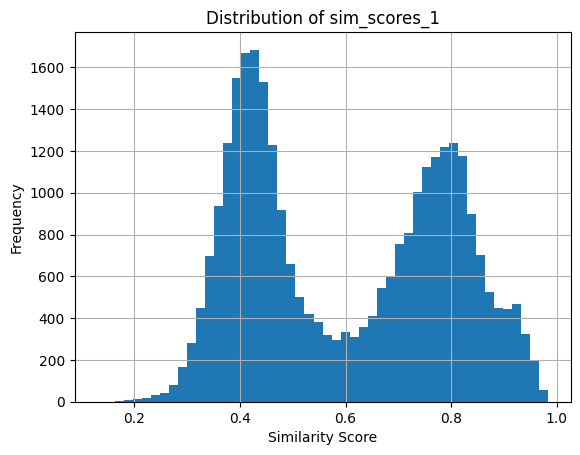

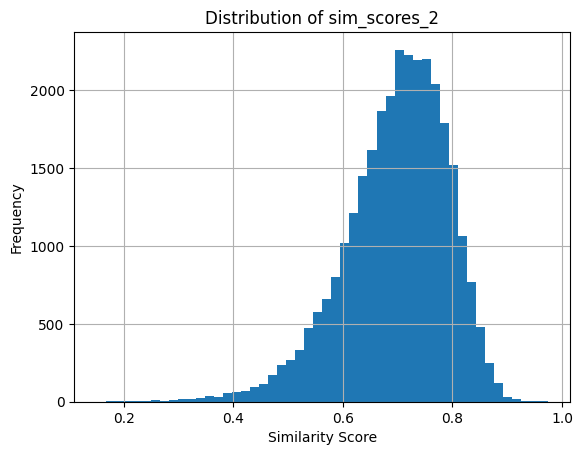

In [24]:
merged_df['sim_scores_1'].hist(bins=50)
plt.title('Distribution of sim_scores_1')
plt.xlabel('Similarity Score')
plt.ylabel('Frequency')
plt.show()

merged_df['sim_scores_2'].hist(bins=50)
plt.title('Distribution of sim_scores_2')
plt.xlabel('Similarity Score')
plt.ylabel('Frequency')
plt.show()


In [16]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import ipywidgets as widgets
from IPython.display import display
import plotly.express as px
import plotly.io as pio

# Load df1 and df2 from CSV files
df1 = pd.read_csv('out/tur-eng_laser.csv')
df2 = pd.read_csv('out/tur-eng_labse.csv')

# Ensure that 'verse_reference' and 'sim_scores' exist in df1 and df2
# Rename 'sim_scores' columns to distinguish them
df1 = df1.rename(columns={'sim_scores': 'Laser'})
df2 = df2.rename(columns={'sim_scores': 'Labse'})

# Check for duplicates in 'vref_mapped' and handle them
df1_duplicates = df1[df1['vref_mapped'].duplicated(keep=False)]
df2_duplicates = df2[df2['vref_mapped'].duplicated(keep=False)]

if not df1_duplicates.empty:
    print("Duplicates found in df1 'vref_mapped'. Dropping duplicates.")
    df1 = df1.drop_duplicates(subset='vref_mapped', keep='first')

if not df2_duplicates.empty:
    print("Duplicates found in df2 'vref_mapped'. Dropping duplicates.")
    df2 = df2.drop_duplicates(subset='vref_mapped', keep='first')

# Merge df1 and df2 on 'vref_mapped'
merged_data = pd.merge(df1, df2[['vref_mapped', 'Labse']], on='vref_mapped', how='inner')

# Extract Book, Chapter, and Verse information from 'vref_mapped'
# Adjust the regex to handle book names with numbers (e.g., "1 John")
merged_data[['Book', 'ChapterVerse']] = merged_data['vref_mapped'].str.extract(r'^(.*?)\s+(\d+:\d+)$', expand=True)
merged_data[['Chapter', 'Verse']] = merged_data['ChapterVerse'].str.split(':', expand=True)
merged_data.drop(columns=['ChapterVerse'], inplace=True)

# Drop rows with NaN values after extraction
merged_data.dropna(subset=['Book', 'Chapter', 'Verse'], inplace=True)

# Convert Chapter and Verse to integers
merged_data['Chapter'] = pd.to_numeric(merged_data['Chapter'], errors='coerce').astype(int)
merged_data['Verse'] = pd.to_numeric(merged_data['Verse'], errors='coerce').astype(int)

# Add verse name column
merged_data['Verse_Name'] = merged_data['Book'].str.strip() + ' ' + merged_data['Chapter'].astype(str) + ':' + merged_data['Verse'].astype(str)

# Save merged data to CSV
merged_data.to_csv('references/merged_data.csv', index=False)

# Replace infinite values with NaN in score columns
merged_data['Laser'].replace([np.inf, -np.inf], np.nan, inplace=True)
merged_data['Labse'].replace([np.inf, -np.inf], np.nan, inplace=True)

# Remove rows with NaN values in Laser or Labse
merged_data_clean = merged_data.dropna(subset=['Laser', 'Labse'])

# Ensure that 'Laser' and 'Labse' are numeric
merged_data_clean['Laser'] = pd.to_numeric(merged_data_clean['Laser'], errors='coerce')
merged_data_clean['Labse'] = pd.to_numeric(merged_data_clean['Labse'], errors='coerce')

# Check if there are enough data points to calculate correlations
if len(merged_data_clean) < 2:
    print("Not enough valid data points to calculate correlations after cleaning.")
else:
    # Calculate correlations
    pearson_corr, _ = stats.pearsonr(merged_data_clean['Laser'], merged_data_clean['Labse'])
    print(f"Pearson Correlation: {pearson_corr}")

    # Plotting Scatter Plot for Correlation using Plotly
    scatter_plot = px.scatter(
        merged_data_clean, x='Laser', y='Labse',
        title='Scatter Plot of Scores from Laser vs Labse',
        labels={'Laser': 'Score Laser', 'Labse': 'Score Labse'},
        hover_data=['Verse_Name'],
        width=900,  # Set width to make it square
        height=900  # Set height to make it square
    )
    scatter_plot.update_layout(
        xaxis_title='Score Laser',
        yaxis_title='Score Labse',
        template='plotly_white'
    )
    scatter_plot.show()

# Detect outliers using IQR
def detect_outliers_iqr(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

# Detect outliers in the cleaned data
outliers_file1 = detect_outliers_iqr(merged_data_clean, 'Laser')
outliers_file2 = detect_outliers_iqr(merged_data_clean, 'Labse')

if not outliers_file1.empty:
    outliers_file1 = outliers_file1.sort_values(by='Laser', ascending=False)
    print("\nOutliers in file 1 (using IQR method):")
    print(outliers_file1[['Verse_Name', 'Laser']])
else:
    print("\nNo outliers detected in file 1.")

if not outliers_file2.empty:
    outliers_file2 = outliers_file2.sort_values(by='Labse', ascending=False)
    print("\nOutliers in file 2 (using IQR method):")
    print(outliers_file2[['Verse_Name', 'Labse']])
else:
    print("\nNo outliers detected in file 2.")

# Create dropdown to filter by book
books = merged_data_clean['Book'].unique()
dropdown = widgets.Dropdown(
    options=sorted(list(books)),
    description='Select Book:',
    disabled=False,
)

# Function to display data for selected book
def display_data(book):
    import matplotlib.pyplot as plt
    
    filtered_data = merged_data_clean[merged_data_clean['Book'] == book]
    if not filtered_data.empty:
        fig, ax = plt.subplots(figsize=(8, 8))  # Create a square figure
        scatter = ax.scatter(filtered_data['Laser'], filtered_data['Labse'], alpha=0.6)
        ax.set_xlabel('Score Laser')
        ax.set_ylabel('Score Labse')
        ax.set_title(f'Scores for {book}')
        ax.set_aspect('equal')  # Ensure the plot is square
        
        # Add hover functionality
        annot = ax.annotate("", xy=(0,0), xytext=(20,20), textcoords="offset points",
                            bbox=dict(boxstyle="round", fc="w"),
                            arrowprops=dict(arrowstyle="->"))
        annot.set_visible(False)

        def update_annot(ind):
            pos = scatter.get_offsets()[ind["ind"][0]]
            annot.xy = pos
            text = f"{filtered_data['Verse_Name'].iloc[ind['ind'][0]]}\nScore 1: {pos[0]:.2f}\nScore 2: {pos[1]:.2f}"
            annot.set_text(text)

        def hover(event):
            vis = annot.get_visible()
            if event.inaxes == ax:
                cont, ind = scatter.contains(event)
                if cont:
                    update_annot(ind)
                    annot.set_visible(True)
                    fig.canvas.draw_idle()
                else:
                    if vis:
                        annot.set_visible(False)
                        fig.canvas.draw_idle()

        fig.canvas.mpl_connect("motion_notify_event", hover)
        
        plt.show()
    else:
        print(f"No data available for book: {book}")

# Link dropdown with the display function
widgets.interact(display_data, book=dropdown)


Duplicates found in df1 'vref_mapped'. Dropping duplicates.
Duplicates found in df2 'vref_mapped'. Dropping duplicates.


C:\Users\johnr\AppData\Local\Temp\ipykernel_16480\455445541.py:53: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\johnr\AppData\Local\Temp\ipykernel_16480\455445541.py:54: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=

Pearson Correlation: 0.23799129353992435



No outliers detected in file 1.

Outliers in file 2 (using IQR method):
      Verse_Name     Labse
12568  NEH 10:17  0.974263
12565  NEH 10:14  0.973002
12579  NEH 10:28  0.958738
10257    1CH 1:2  0.954377
10281   1CH 1:26  0.949893
...          ...       ...
5304   DEU 14:13  0.190535
12063   EZR 2:32  0.182356
12459   NEH 7:35  0.182356
12042   EZR 2:11  0.170039
17048  PRO 20:25  0.150697

[548 rows x 2 columns]


interactive(children=(Dropdown(description='Select Book:', options=('1CH', '1CO', '1JN', '1KI', '1PE', '1SA', …

<function __main__.display_data(book)>

### main

In [18]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import ipywidgets as widgets
from IPython.display import display
import plotly.express as px
import plotly.graph_objects as go

# Load df1 and df2 from CSV files
df1 = pd.read_csv('out/hin-eng_laser.csv')
df2 = pd.read_csv('out/Hindi_KJV_LABsE.csv')

# Ensure that 'vref_mapped' and 'sim_scores' exist in df1 and df2
# Rename 'sim_scores' columns to distinguish them
df1 = df1.rename(columns={'sim_scores': 'Laser'})
df2 = df2.rename(columns={'sim_scores': 'Labse'})

# Check for duplicates in 'vref_mapped' and handle them
df1_duplicates = df1[df1['vref_mapped'].duplicated(keep=False)]
df2_duplicates = df2[df2['vref_mapped'].duplicated(keep=False)]

if not df1_duplicates.empty:
    print("Duplicates found in df1 'vref_mapped'. Dropping duplicates.")
    df1 = df1.drop_duplicates(subset='vref_mapped', keep='first')

if not df2_duplicates.empty:
    print("Duplicates found in df2 'vref_mapped'. Dropping duplicates.")
    df2 = df2.drop_duplicates(subset='vref_mapped', keep='first')

# Merge df1 and df2 on 'vref_mapped'
merged_data = pd.merge(df1, df2[['vref_mapped', 'Labse']], on='vref_mapped', how='inner')

# Extract Book, Chapter, and Verse information from 'vref_mapped'
# Adjust the regex to handle book names with numbers (e.g., "1 John")
merged_data[['Book', 'ChapterVerse']] = merged_data['vref_mapped'].str.extract(r'^(.*?)\s+(\d+:\d+)$', expand=True)
merged_data[['Chapter', 'Verse']] = merged_data['ChapterVerse'].str.split(':', expand=True)
merged_data.drop(columns=['ChapterVerse'], inplace=True)

# Drop rows with NaN values after extraction
merged_data.dropna(subset=['Book', 'Chapter', 'Verse'], inplace=True)

# Convert Chapter and Verse to integers
merged_data['Chapter'] = pd.to_numeric(merged_data['Chapter'], errors='coerce').astype(int)
merged_data['Verse'] = pd.to_numeric(merged_data['Verse'], errors='coerce').astype(int)

# Add verse name column
merged_data['Verse_Name'] = merged_data['Book'].str.strip() + ' ' + merged_data['Chapter'].astype(str) + ':' + merged_data['Verse'].astype(str)

# Save merged data to CSV
merged_data.to_csv('references/merged_data.csv', index=False)

# Replace infinite values with NaN in score columns
merged_data['Laser'].replace([np.inf, -np.inf], np.nan, inplace=True)
merged_data['Labse'].replace([np.inf, -np.inf], np.nan, inplace=True)

# Remove rows with NaN values in Laser or Labse
merged_data_clean = merged_data.dropna(subset=['Laser', 'Labse'])

# Ensure that 'Laser' and 'Labse' are numeric
merged_data_clean['Laser'] = pd.to_numeric(merged_data_clean['Laser'], errors='coerce')
merged_data_clean['Labse'] = pd.to_numeric(merged_data_clean['Labse'], errors='coerce')

# Check if there are enough data points to calculate correlations
if len(merged_data_clean) < 2:
    print("Not enough valid data points to calculate correlations after cleaning.")
else:
    # Calculate correlations
    spearman_corr, _ = stats.spearmanr(merged_data_clean['Laser'], merged_data_clean['Labse'])
    pearson_corr, _ = stats.pearsonr(merged_data_clean['Laser'], merged_data_clean['Labse'])

    print(f"Spearman Correlation: {spearman_corr}")
    print(f"Pearson Correlation: {pearson_corr}")

    # Plotting Interactive Scatter Plot with separate colors for df1 and df2
    fig = go.Figure()

    # Add traces for each dataset
    fig.add_trace(go.Scatter(
        x=merged_data_clean['Verse_Name'],
        y=merged_data_clean['Laser'],
        mode='lines+markers',
        name='Laser',
        line=dict(color='blue'),
        marker=dict(color='blue'),
        hoverinfo='text',
        hovertext=merged_data_clean['Verse_Name']
    ))

    fig.add_trace(go.Scatter(
        x=merged_data_clean['Verse_Name'],
        y=merged_data_clean['Labse'],
        mode='lines+markers',
        name='Labse',
        line=dict(color='red'),
        marker=dict(color='red'),
        hoverinfo='text',
        hovertext=merged_data_clean['Verse_Name']
    ))

    # Update layout
    fig.update_layout(
        title='Scores Comparison Across Verses',
        xaxis_title='Verse',
        yaxis_title='Score',
        xaxis_tickangle=-90,
        hovermode='closest',
        template='plotly_white'
    )

    # Show the interactive plot
    fig.show()

    # Interactive Scatter Plot for Correlation
    scatter_plot = px.scatter(
        merged_data_clean,
        x='Laser',
        y='Labse',
        color='Book',
        title='Scatter Plot of Scores from Laser vs Labse',
        labels={'Laser': 'Laser', 'Labse': 'Labse'},
        hover_data=['Verse_Name']
    )
    scatter_plot.update_layout(
        xaxis_title='Laser',
        yaxis_title='Labse',
        template='plotly_white'
    )
    scatter_plot.show()

# Detect outliers using IQR
def detect_outliers_iqr(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

# Detect outliers in the cleaned data
outliers_file1 = detect_outliers_iqr(merged_data_clean, 'Laser')
outliers_file2 = detect_outliers_iqr(merged_data_clean, 'Labse')

if not outliers_file1.empty:
    outliers_file1 = outliers_file1.sort_values(by='Laser', ascending=False)
    print("\nOutliers in file 1 (using IQR method):")
    display(outliers_file1[['Verse_Name', 'Laser']])
else:
    print("\nNo outliers detected in file 1.")

if not outliers_file2.empty:
    outliers_file2 = outliers_file2.sort_values(by='Labse', ascending=False)
    print("\nOutliers in file 2 (using IQR method):")
    display(outliers_file2[['Verse_Name', 'Labse']])
else:
    print("\nNo outliers detected in file 2.")

# Create dropdown to filter by book
books = merged_data_clean['Book'].unique()
dropdown = widgets.Dropdown(
    options=sorted(list(books)),
    description='Select Book:',
    disabled=False,
)

# Function to display data for selected book
def display_data(book):
    filtered_data = merged_data_clean[merged_data_clean['Book'] == book]
    if not filtered_data.empty:
        # Interactive plot for the selected book
        fig = go.Figure()

        # Add traces for each dataset
        fig.add_trace(go.Scatter(
            x=filtered_data['Verse_Name'],
            y=filtered_data['Laser'],
            mode='lines+markers',
            name='Laser',
            line=dict(color='blue'),
            marker=dict(color='blue'),
            hoverinfo='text',
            hovertext=filtered_data['Verse_Name']
        ))

        fig.add_trace(go.Scatter(
            x=filtered_data['Verse_Name'],
            y=filtered_data['Labse'],
            mode='lines+markers',
            name='Labse',
            line=dict(color='red'),
            marker=dict(color='red'),
            hoverinfo='text',
            hovertext=filtered_data['Verse_Name']
        ))

        # Update layout
        fig.update_layout(
            title=f'Scores Comparison in {book}',
            xaxis_title='Verse',
            yaxis_title='Score',
            xaxis_tickangle=-90,
            hovermode='closest',
            template='plotly_white'
        )

        fig.show()

        # Display the data table
        display(filtered_data[['Verse_Name', 'Laser', 'Labse']])
    else:
        print(f"No data available for book: {book}")

# Link dropdown with the display function
widgets.interact(display_data, book=dropdown)



Duplicates found in df1 'vref_mapped'. Dropping duplicates.
Duplicates found in df2 'vref_mapped'. Dropping duplicates.


C:\Users\johnr\AppData\Local\Temp\ipykernel_16480\3587763209.py:53: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\johnr\AppData\Local\Temp\ipykernel_16480\3587763209.py:54: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplac

Spearman Correlation: 0.1976940612900516
Pearson Correlation: 0.19281405082400585



No outliers detected in file 1.

Outliers in file 2 (using IQR method):


,Verse_Name,Labse
29024,2CO 9:1,0.548650
16839,PRO 13:23,0.548620
13792,JOB 37:20,0.548596
22481,AMO 4:3,0.548596
17154,PRO 24:6,0.548318
...,...,...
20886,EZK 16:56,0.254127
20887,EZK 16:57,0.232178
28865,1CO 16:22,0.228558
18083,ISA 19:10,0.157019


interactive(children=(Dropdown(description='Select Book:', options=('1CH', '1CO', '1JN', '1KI', '1PE', '1SA', …

<function __main__.display_data(book)>